In [4]:
### Dark theme for jupyter notebook, no need to run.
#!pip install jupyterthemes
#!pip install --upgrade jupyterthemes
#!jt -l
#emir's choice
#!jt -t chesterish -T -N -kl -tf ptsans -tfs 13 -f fira -fs 11 -ofs 10 -nf ptsans -nfs 13 -cursw 2 -cursc r -cellw 88% -vim

# from jupyterthemes import jtplot

# choose which theme to inherit plotting style from
# onedork | grade3 | oceans16 | chesterish | monokai | solarizedl | solarizedd
# jtplot.style(theme='chesterish', ticks=True,)
# sns.set_style("whitegrid")

## **CNN with MNIST Data**

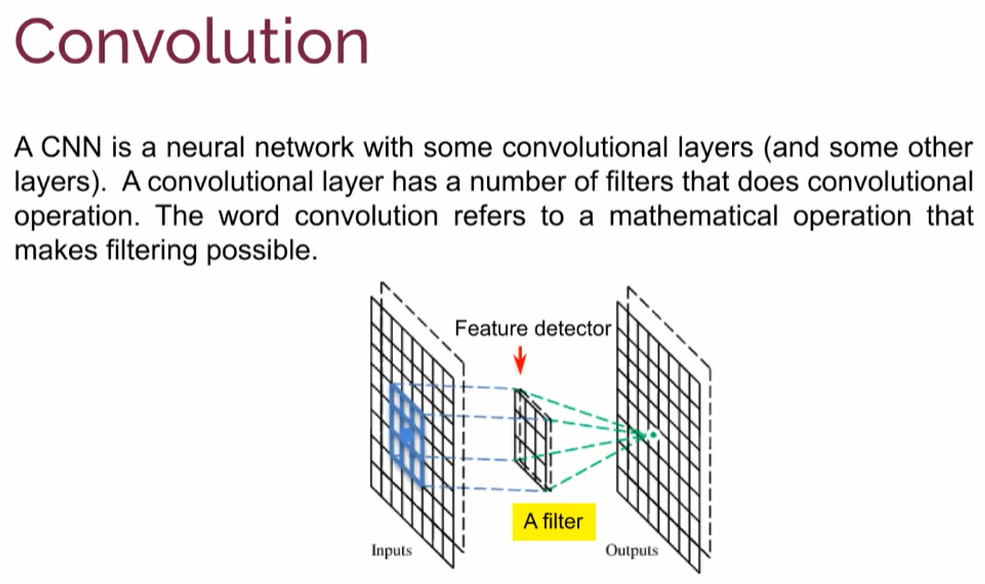

- Bizim elimizdeki resimlere bir filtre uygulayarak istediğimiz özelliklerini çekme işlemine **CONVOLUTION** denir.
- Resmimizden istediğimiz noktaları alıp (en son ne yapmak stiyorsak) modele sokmamıza yarar.

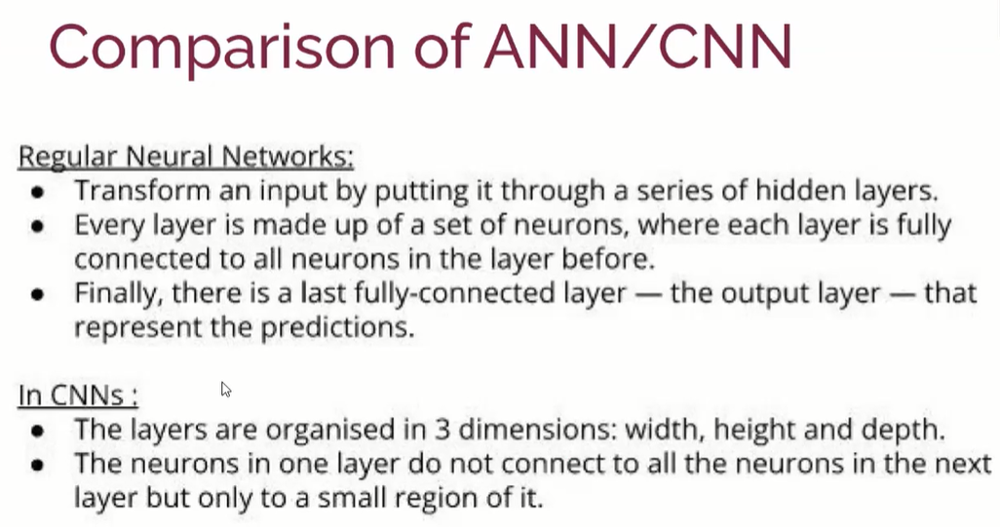

<span style="color:red">**ANN**</span>
- Normal ANN de birden çok veya tek bir hidden layer marifeti ile ***fully connected*** yani bütün nöronların birbirleri ile bağlantısı olacak şekilde bir modelimiz var.
- En sonda da prediction yapmamızı sağlayan output layerımız var.

<span style="color:red">**CNN**</span>
- Durum biraz daha farklı. CNN de bir dataframemimiz (kolon ve sütunumuz yok) resimleri kullanırız.
- Resmin genişliği eni boyu kullanılır ve bazı layerlar fully connected olmayacak ve işimizi hızlandıracak.


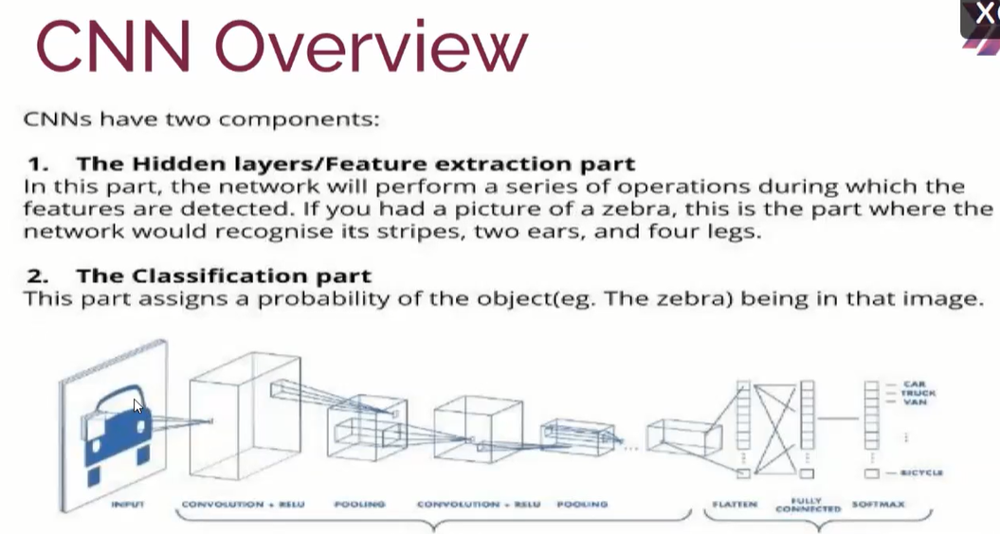

- Input arabanın olduğu bir resim/fotoğraf. Yukarıda gördüğünüz gibi işlemler sırarsıyla yapılacaktır.
- Temelde 1 tane convolution layer ve 1 tane de pooling layer olacak.
- Daha sonra da elimizdeki bu 1 den fazla boyutlu olan layerları tek boyuta düşürmemiz lazım. ANN de kullandığımız gibi. Yani şu ana kadarki elde etiiğimiz verileri flatten yaparak, bizim modelimize sokabileceğimiz hale getiriyoruz. Tek bir sıra haelinde uzanmış nöronlar haline.
- Daha sonra dense layerları ekleyerek (air classification sayısı 2 den fazla ise softmax ya da binary ise sigmoid ekleyerek) bir tane classification işlemi gerçekleştiriyoruz.
- Bu da resimde bir object var mı yok mu, yani; mesela resimde 10 tane hayvan resmi var, elimizdeki rresim hangi hayvanı gösteriyor gibi classification yapabiliriz. 

<span style="color:red">**Yani CNN Nedir?**</span>
- Convolutional layerlar + Pooling layerlar + ANN

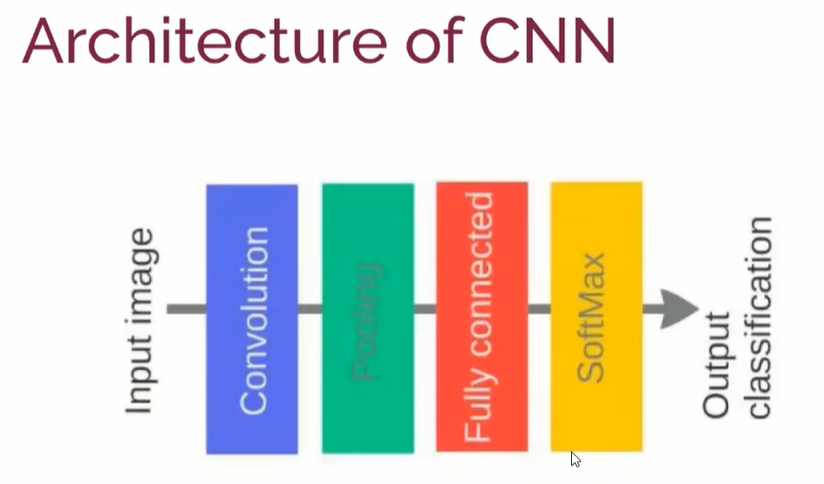

***Bu aşamalar sırası ile açıklanacaktır.***
- Input resmimiz var. (yukarıdaki gibi araba olabilir.)
    - Convolutional işlemi var
    - Pooling yapılacak
    - Fully Connected Layer yapılacak + Softmax (Bu zaten görmüş olduğumuz ANN)
    - Output Layer konulacak

Böylelikle ilk soktuğumuz imputun hangi class a ait olup olmadığını tespit edeceğiz.

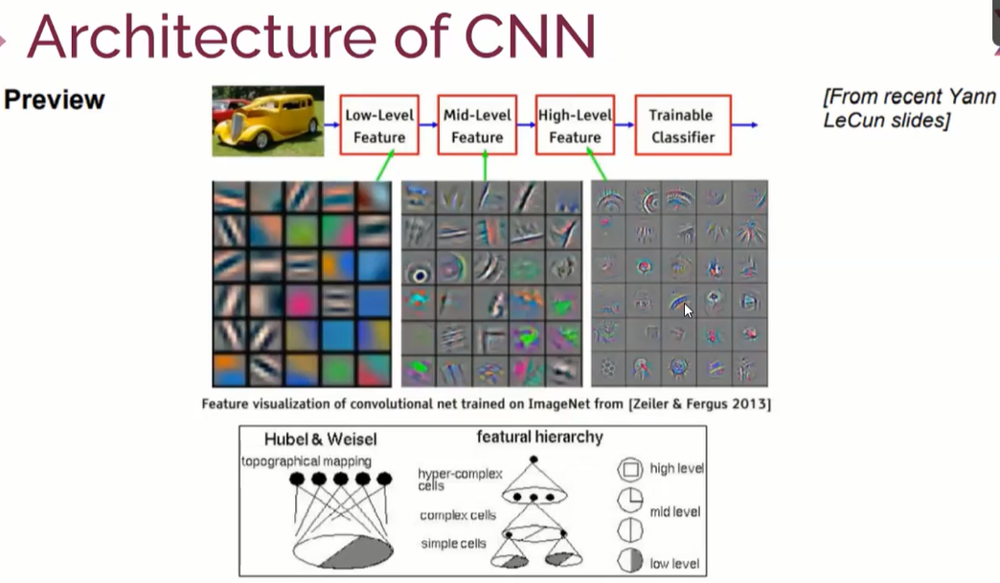

- 1 tane kernel vasıtası ile resimdeki ihtiyacımız olan featureları / noktaları resimden çekeceğiz ve modele işleyeceğiz.
- Her layer farklı işlemler ile alır, yukarıda görüldüğü gibi.
- Zaten resmin ne olduğunu tahmin yani classification yapacağız. (resimde insan mı var hayvan mı var (object detection)/ çöp mü var vesaire)
- Benzin istasyonlarında araç var mı yok mu vesaire.
- Zaten 1 - 0 mantığı üzerine işliyor.

- Bir sürü algoritma var; object detection (kedi mi değil mi) --> Low level
    - Hayvan yatıyor mu koşuyor mu? --> Mid level
 
- Ama biz sadece bugün model oluşturmayı göreceğiz, bunlara dalmadan devamke.

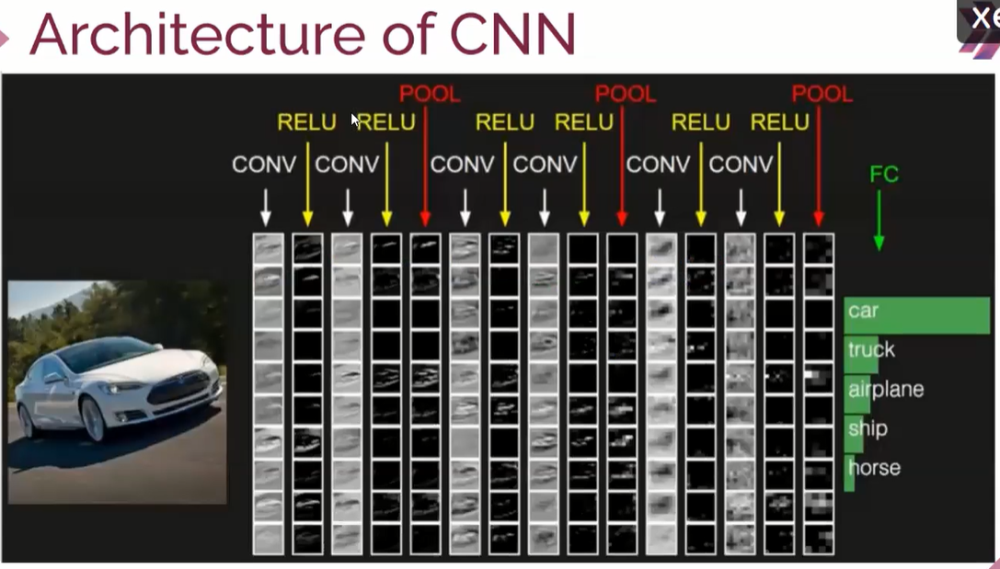

<span style="color:red">CNN TEMEL İŞEME MANTIĞI</span>
- Mesela bir tane input araba resmimiz var.
- Bir tane conv. layer ekledik.
- RELU bildiğimiz gibi zaten activation function umuz.
- Bir conv. layer daha ( 2 tane oldu şimdiye kadar)
- Daha sonra Pooling var. (İlerleyen yansılarda anlatılacak)
- Daha sonra tekrardan bir tane daha conv. layer.
    - <span style="color:yellow">Bunları koymak zorunda değiliz. Bunlar elimizdeki fotonun kalitesine veya bizim detect etmek istediğimiz hususlara bağlı olarak değişebilir.</span>
- Bir tane convolutional Layer ve bir tane de Pooling Layer şarttır. İhtiyaca binaen tekrar tekrar inşa edilebilir.
- İhtiyacın görülüyorsa fazlasına gerek yok. 
- En son bittikten sonra ***fully connected layer*** yani ***ANN*** inşa ederek;<br>
karşımızda görmüş olduğumuz resmin araba mı yoksa diğer vesaetler olup olmadığını tespit ediyoruz.

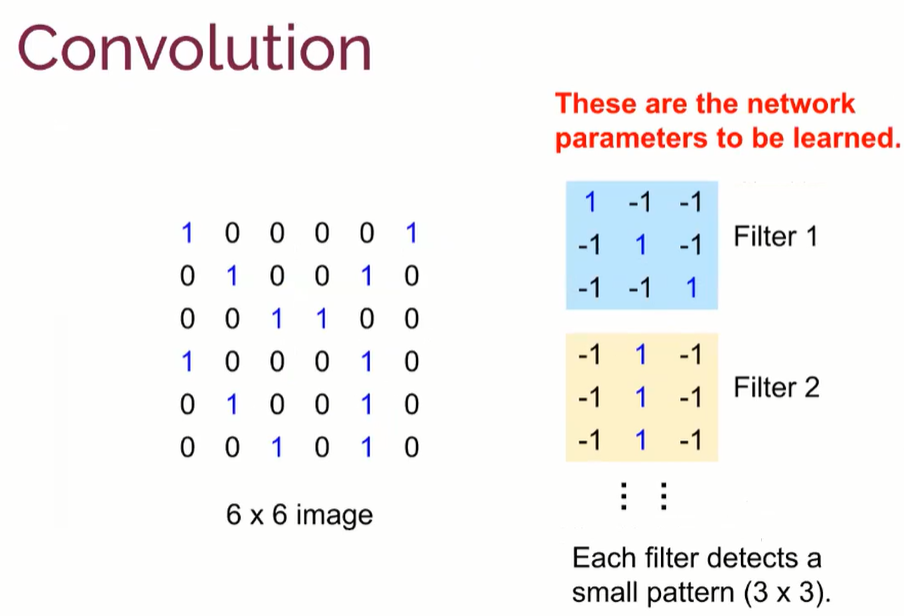

<span style="color:red">Convolution Nedir? Nasıl Yapılır?</span>
- <span style="color:yellow">En önemli yer burasıdır.</span>
    - Bir resmimiz var ve bu resimdeki 1'ler genel itibari ile
    - Bir resimde 256 pixel var [0-255]. 255'e yaklaştıkça beyaza (açık) doğru 0'a doğru yaklaştıkça siyaha (koyu) doğru bir temsil vardır.
    - Bunlar da RGB nin karışımı ile sağlanacak. (değişik oranlarda)

- Filter sayısı ve boyutu tamamıyla <span style="color:red">resmimizdeki / fotoğrafımızdaki object'lerin kalitesi</span> ve <span style="color:red">sayısı</span> ve <span style="color:red">class sayısı</span> ile alakalı olacak.
- Hep 3X3 kullanacağız diye bir şey yok. Domain Knowledge ile öğreneceğiz.
- Modelimizin başarı yüzdesine göre filter sayısı ve boyutu değiştirilebilir.

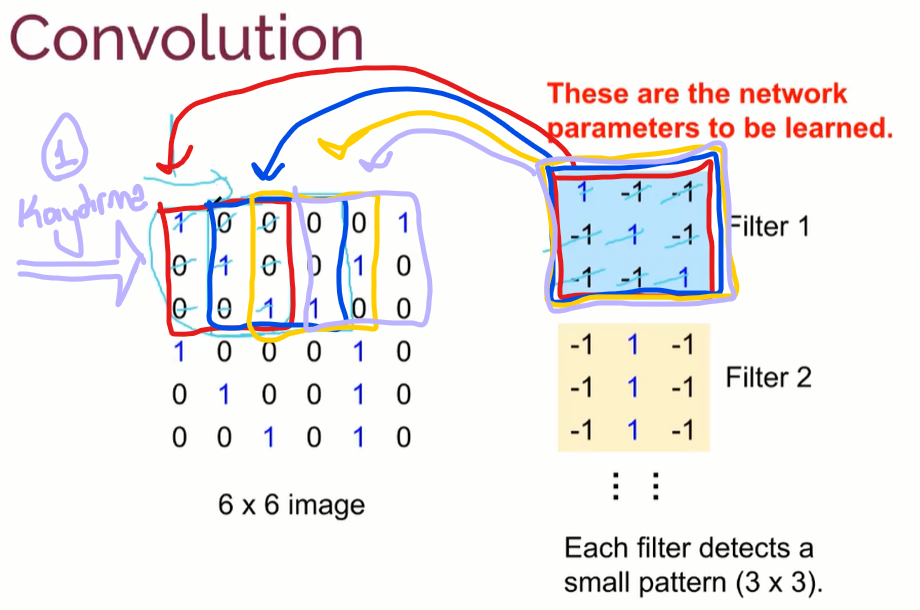

<span style="color:red">CONVOLUTIONAL TEMEL MANTIĞI</span>
- filter 1 alınır --> sol üst köşeye konur (yukarıda resmi var) --> Bu bizim vermiş olduğumuz bir filter. NŞA'da biz filterlardaki değerleri vermeyiz, model onları kendi bulur (weights and bias)
- Karşılık gelen sayılar çarpılır. 3X3 lük çarpım sonucu rakamlar toplanır. Ve çıkan sonuç kaydedilir.
- Sonra stride (kaydırma) işlemi gerçekleştirilir. Ne kadar kaydırılacağı foto özelliklerine bağlı olarak bize kalır. Biz burada 1 seçtik.
- Animasyon izlenebilir.

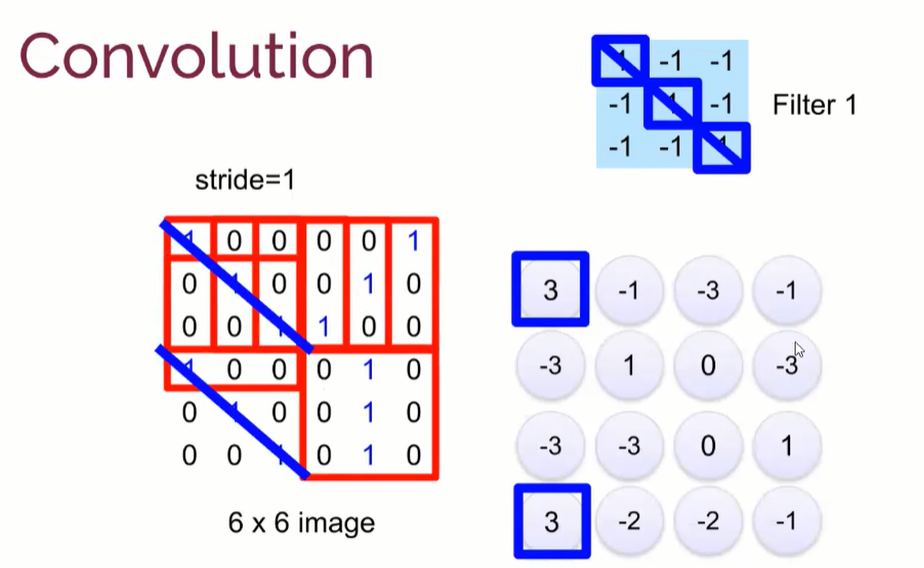

- Sonuç olarak yukarıdaki gibi bir çıktım olacak. 4X4 lük yeni bir matris (image)'ım oldu.
- Formül: (tek bir eksen için) 
    - Y eksenimde piksel sayım 6 idi.
    - Kullandığım filtrenin ki 3 idi.
    - Stride sayım ise 1 idi.
        - ((image y ekseni piksel sayısı - filtre y ekseni piksel sayısı) / Stride sayısı) + 1
        - ((6-3)/1)+1 = 4
- 6X6 dan 4X4'e düştük. Kenardaki bazı noktalar alınamamış olabilir. Bunun için ise <span style="color:red">PADDING</span> diye bir işlem kullanılır.
- Bu işlemi kaç tane filtre varsa o kadar tekrar eder ve o kadar 4X4 lük matris oluşturur.

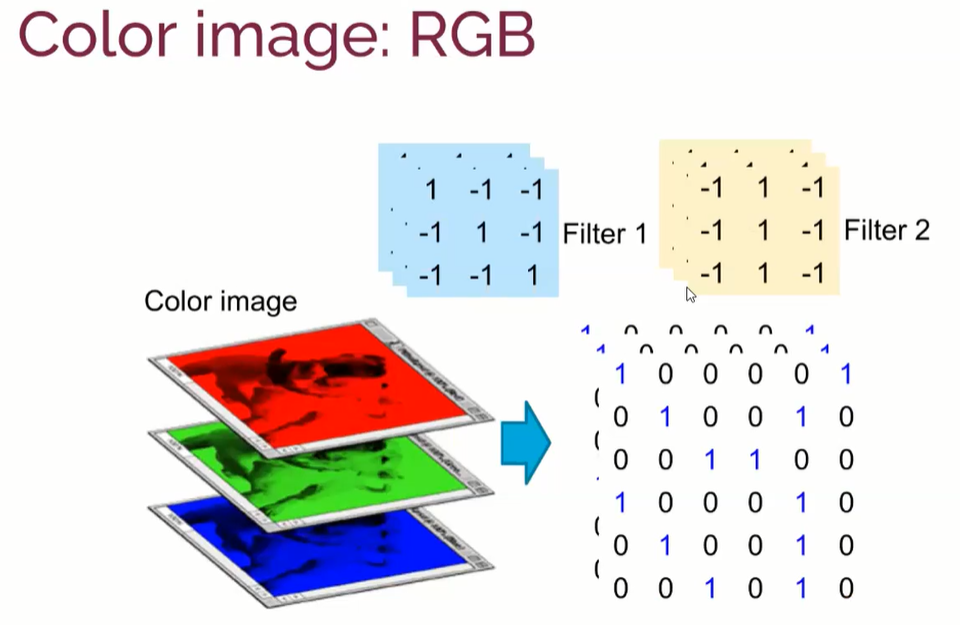

- Eğer renkli bir image olsaydı siyah beyaza kıyasla 3 kat daha fazla bir sonuç üretilecek ve model büyüyüp ve parametre artacak.
- <a href="setosa.io/ev/image-kernels/">Online deneme yapabılabilecek bir site.</a>

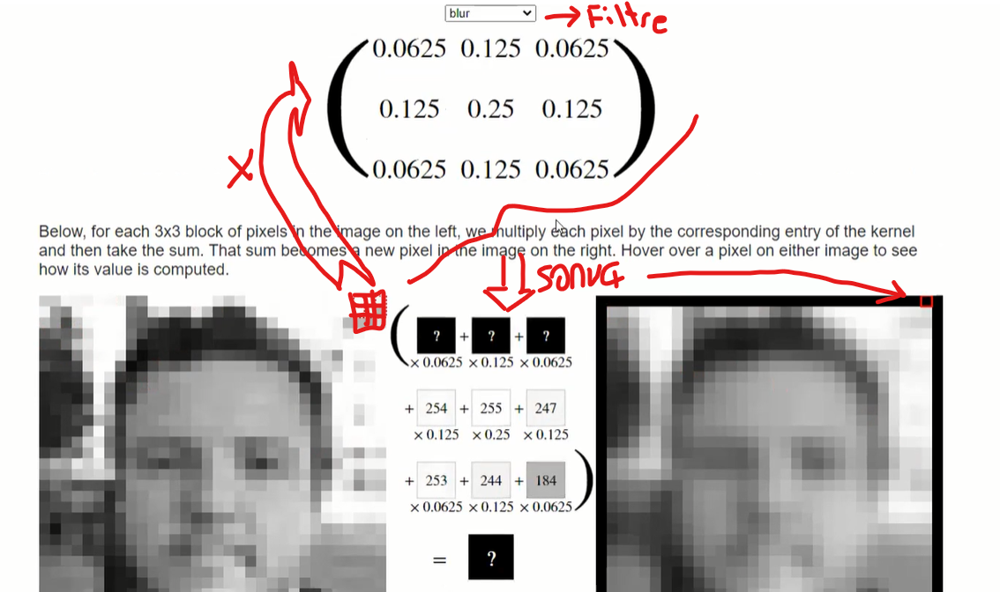

<span style="color:red">**CONVOLUTION'U ANLAMAK ISTERSEN O SITEYE GIR VE ZAMAN HARCA**</span>
- Yukarıda örnek olarak filtre tipi blur seçildi ve soldaki resim sağdaki sonucu verdi. 
- İstersen dene oyna değiştir ve gör...
    - Diğer filtreleri (bottom sobel, left sobel) çalış öğren tekrarla ve kullanım amaçlarına bak...
- Bu sitede daha önceden bulunmuş ve denenmiş kernel değerleri var, biz kernel girmeyeceğiz ama ilerleyen zamanlarda kendimiz de girebiliriz belki. Biz modelin parametrelerini kendisi öğrenmesini istiyoruz. Bu site sadece conv. işlemi nedir anlayalım diye var.

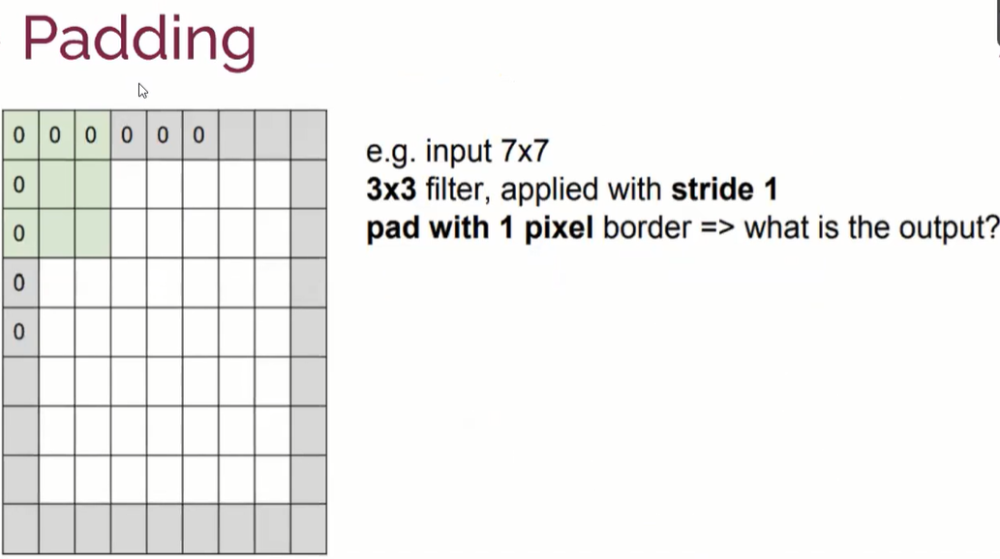

<span style="color:red">**PEDDING NEDIR**</span>
- Şu ana kadar convolution nedir onu gördük. --> filtre , filtre ne işe yarar (kernel), kaça kaç işlem ve ne çıkar, stride (yana ve aşağı doğru kaçar kare atlanması gerek)
- ***Şimdi bir de Padding denen bir işlem var.***
    - Eğer fotomuzdaki nesnemiz merkezde değil ve köşelerde ise o kenarları da almamız gerek ve oralara 0'lar atarız.
    - Yani padding bize resmlerin kenarlarındaki verileri kaybetmememizi sağlar.
- İki parametresi var: --> padding valid ve padding same --> bunlar zaten notebook'da var.
    - Eğer valid kullanırsak şu an resim ne ise onu al kenarları kullanma.
    - Padding same dersek, benim image kaça kaç girdi ise çıkışta da aynısı olsun, ona göre sen otomatik sıfırları koy. Çıktı da aynı boyutta olur.

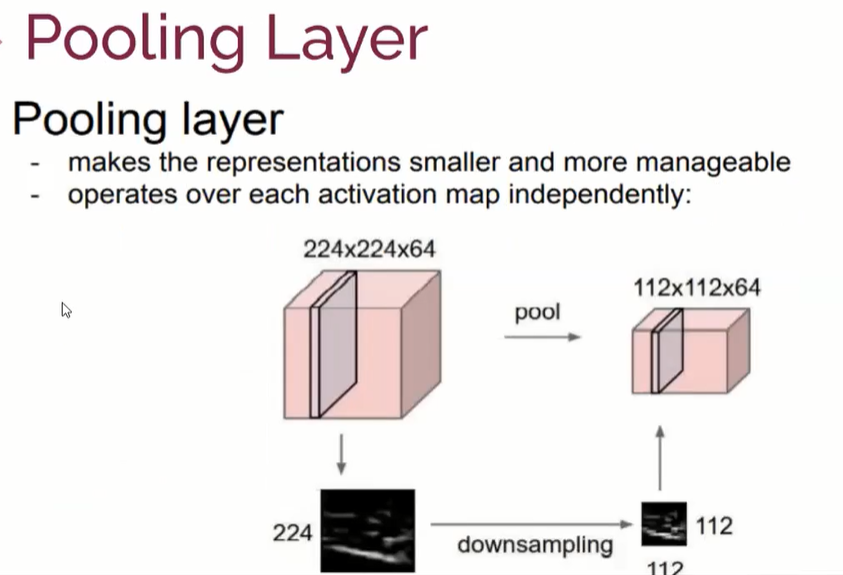

<span style="color:red">**POOLING LAYER NEDIR ve NE YAPAR?**</span>
- 64 tane boyutu olan (64 tane filtreden çıkmış) 224X224 boyutu olan rakamlarımız var.
- Bizim için en önemli veriyi taşıyan değeri alıyoruz. (Şu an max kullanılıyor.) Yani 2X2 lik bir pooling ile resmin verilerini yarıya düşürmüş.
- Bizim vereceğimiz pencere içerisindeki maksimum değerleri alarak, yani o kareciği temisl eden en büyük değer ne ise onu almak suretiyle pxel sayısı yarıya düştü. 
- Resmin özün alıyoruz. Orada bir sürü siyah nokta var ise hepsini almanın gereği yok.
    - <span style="color:yellow">Farklı yöntemler var. mean gibi. Ama en çok kullanılanlar max'dır.</span>

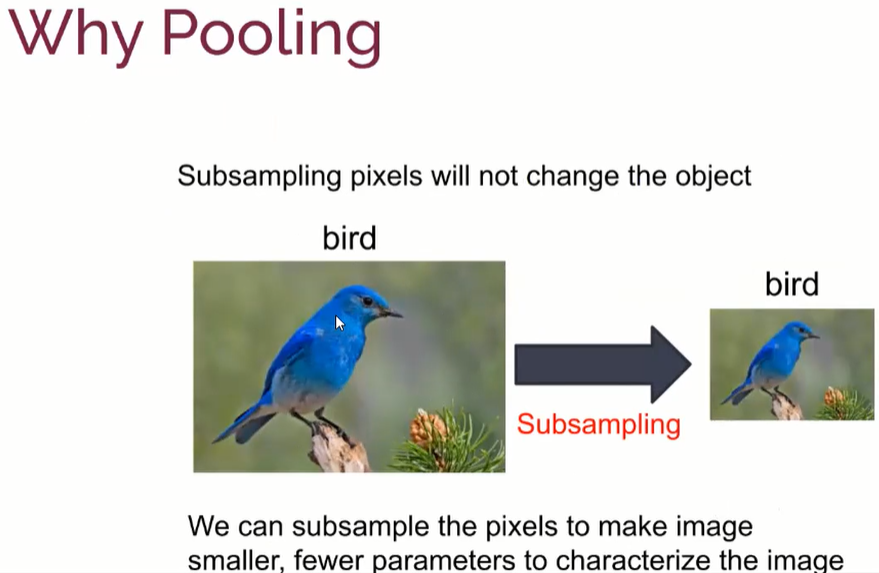

- Tam olarak yaptığımız yukarıdaki resim de anlatılıyor. Elimizdeki resim küçülürken parametre sayımız da azalıyor ve computational gain sağlıyor.
- İşlem daha kısa olacak. Kalite düşebilir ama öğrenme yapabiliyorsak hiç problem değil.

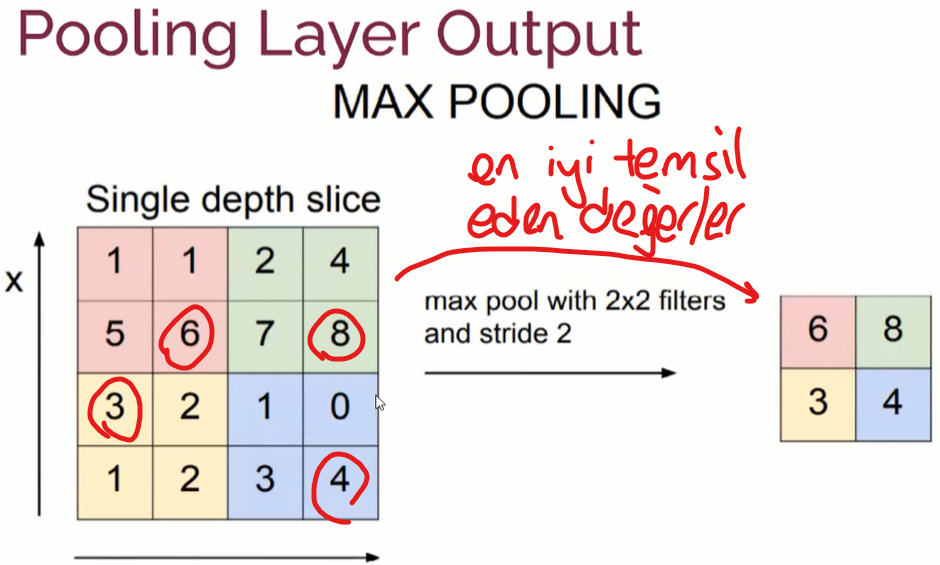

- Yukarıda remimizin kalitesi düşebilir ama zaten modelimiz yorumlayabiliyorsa bu işlem bize hıxz kazandırır ve cost efficient olur.

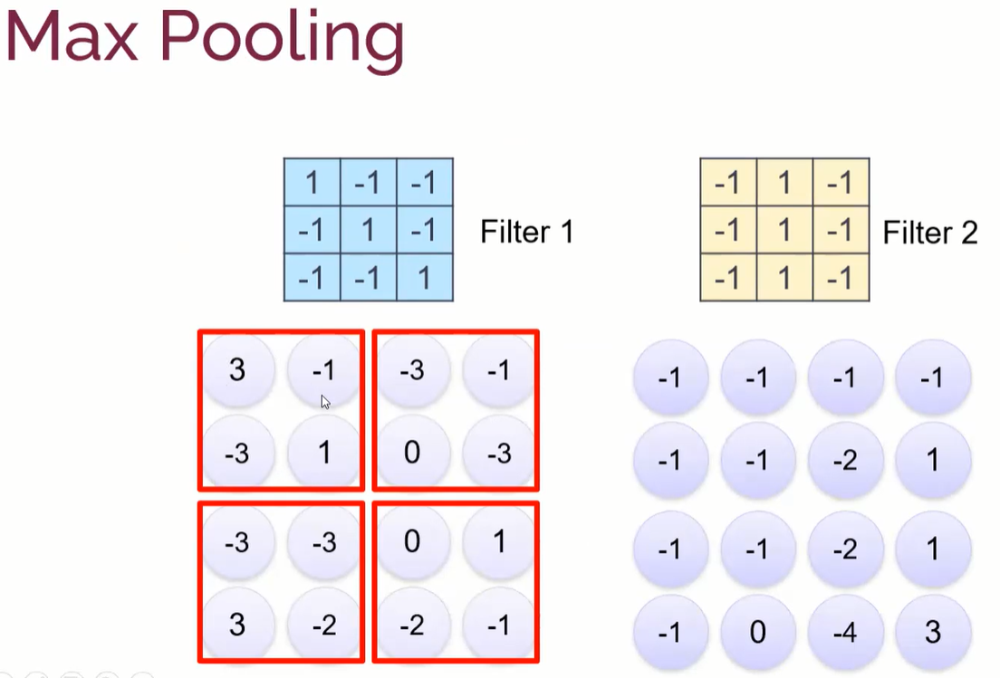
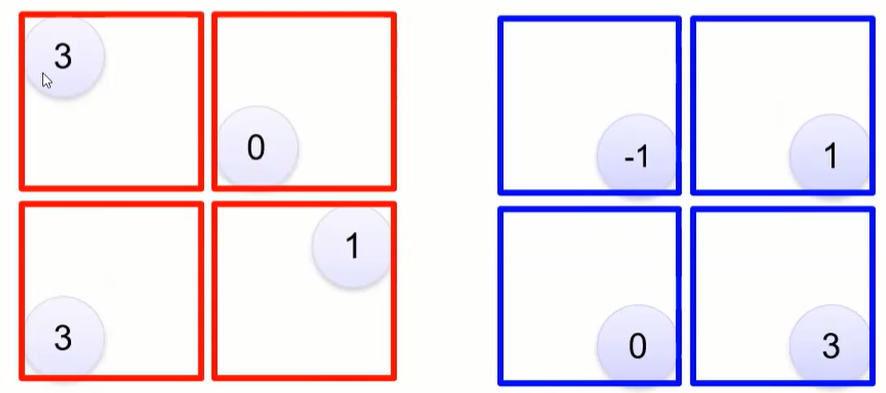
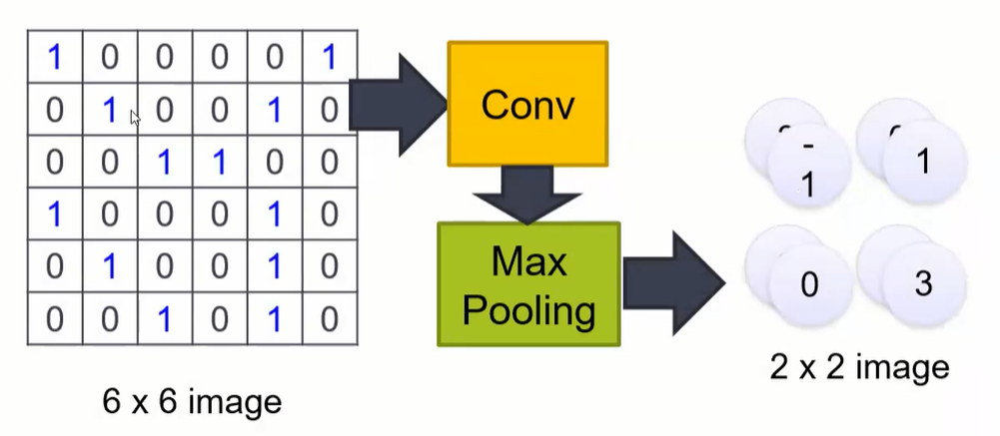

<span style="color:red">Max Pooling</span>
- 2X2'lik alanda stride'ın 2 olduğu bir filtre uyguladık (yukarıda) 
- Kırmızı ve mavi karelerin içindeki en büyük değerleri (en iyi temsil eden değerleri alacak)
- 6X6'dan 2X2'lik bir image çıkardık.
- Şu an modele sokabilirim ama ihtiyaca göre daha da conv ve max pooling yapabilirim. Ama temel mantığımız bu.   

### <center><span style="color:red"><b>ŞU ANA KADAR YAPILAN GENEL ÖZET<b></span></center><br>
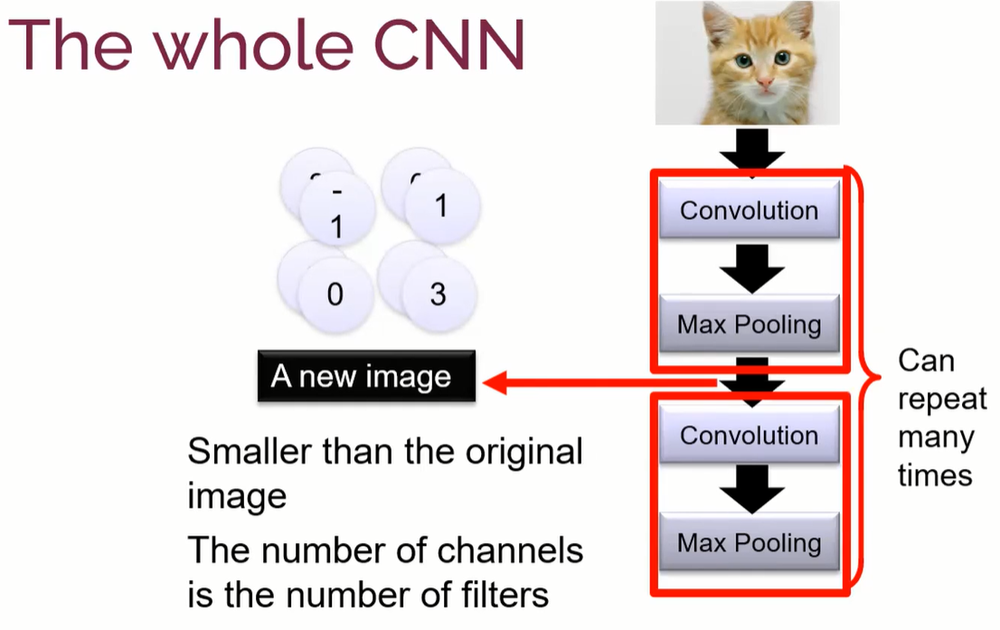

- Kedi resmime 1 tane convolution uyguladım. Ama bunun gerçekte filtrenin ne olduğunu bilmiyorum. Model onu kendi öğreniyor. Buradan ne alabilirim diye parametrelerini kendi belirliyor.
- Daha sonra bir max pooling uyguladım. (6X6 dan 2X2 lik bir image a döndü az önceki, 2 tane filtre uygulayarak)
- Daha sonra ben buna itersem bir tane daha convolution ve max pooling uygulayıp modelimi inşa edebilirim.
    - <span style="color:yellow">Müteakip işlemler de aşağıdaki resimde mevcuttur.</span>

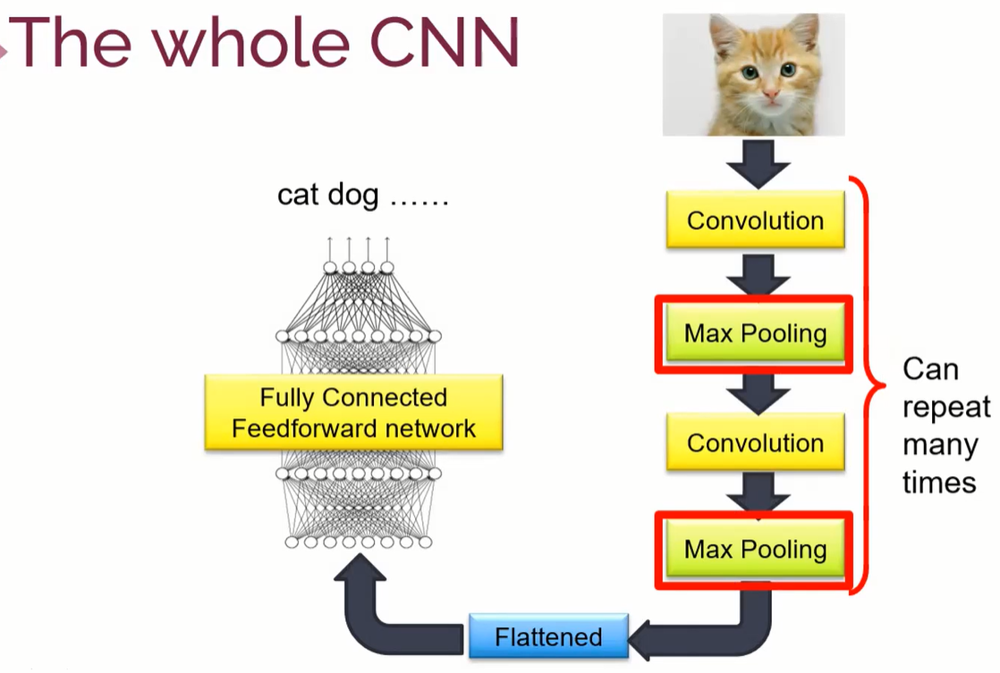

- **FLATTEN**: Elimizdeki matrisi 1X1 hale getiryor. np.flatten
- Daha sonra modele sokup cat mi dog mu olduğu ortaya çıkacak.

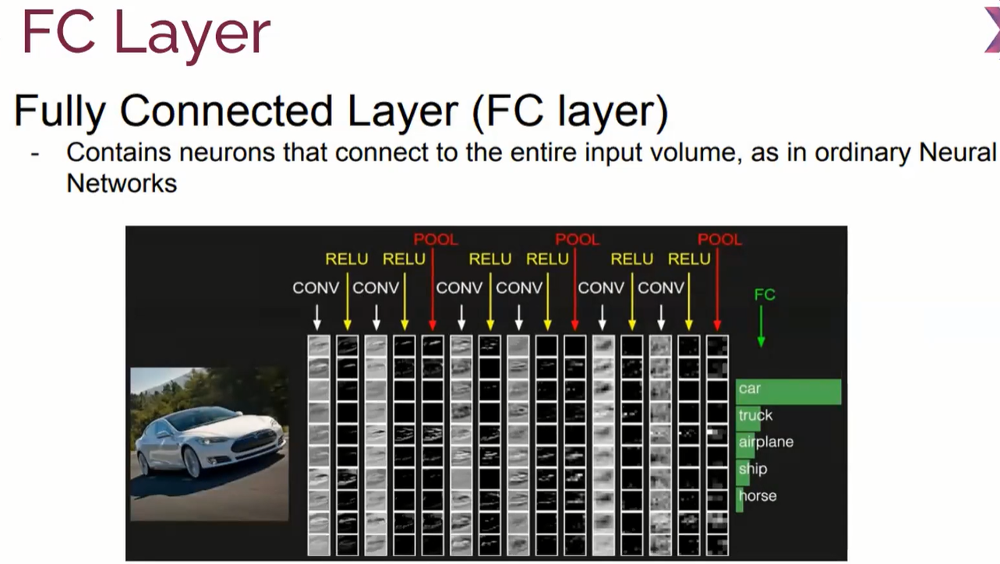

- Modelin çalışabilmesi için FC Layer a ihtiyaç vardır. Biz şimdi FC ye kadar geldik.
- Bir tane flatten koyarak daha sonra FC Layer yapacağız. 
    - 2X2 lik matrisi 1X1 lik hale getireceğiz
    - ANN de olduğu gibi tüm nöronların birbiri ile bağlantısı olacak şekilde model kuracağız (dense layer ekleyip output layer koyacağız.)

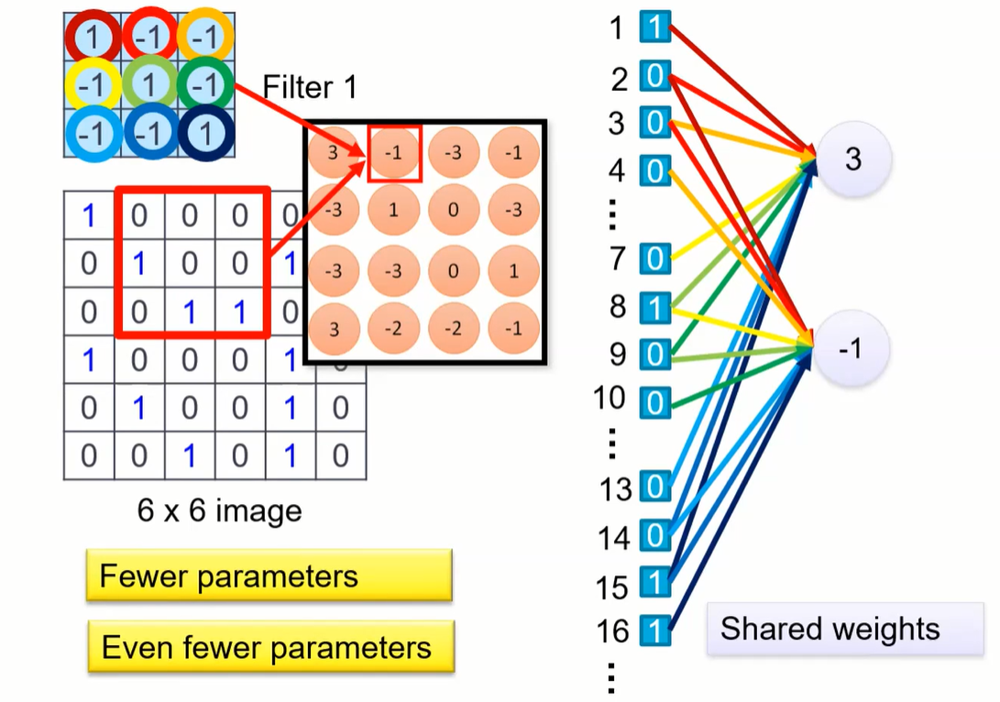

- Ağırlıklar share ediliyor, özellikle edge kısımlardaki
- Parametre sayısı azalır
- Computational power ımız artar
- Zaman kazanırız

Not: Backpropagation sadece ilgili olduğu nokta ile (connect) var. Mesela 3'ün bağlı oldukları ile var, o yüzden fully connected değil.

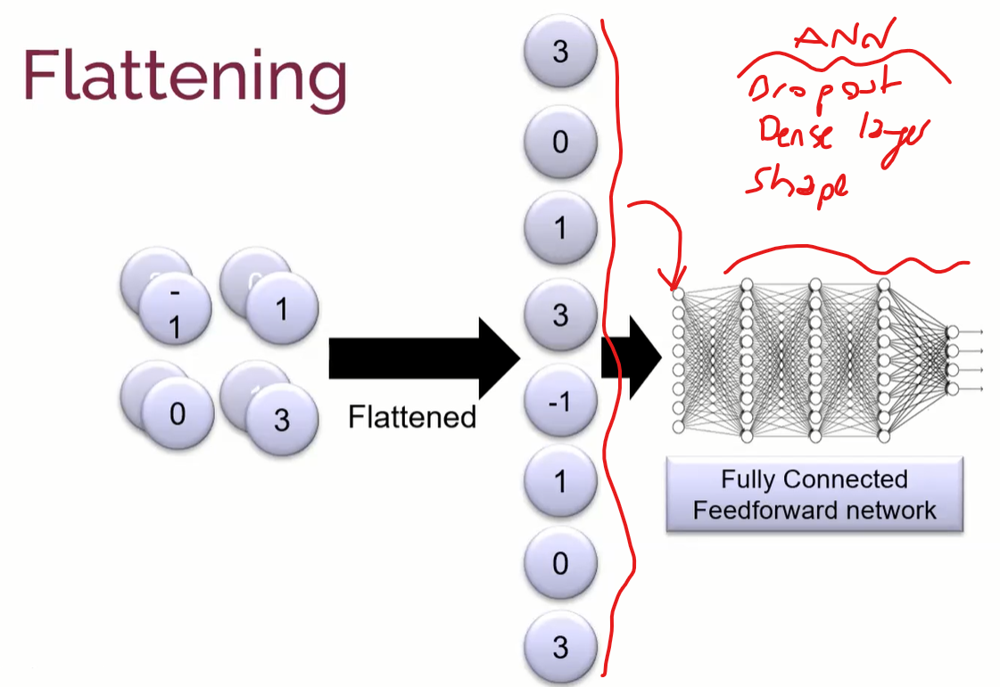

### <center><span style="color:red"><b>TÜM CNN SÜRECİ<b></span></center><br>
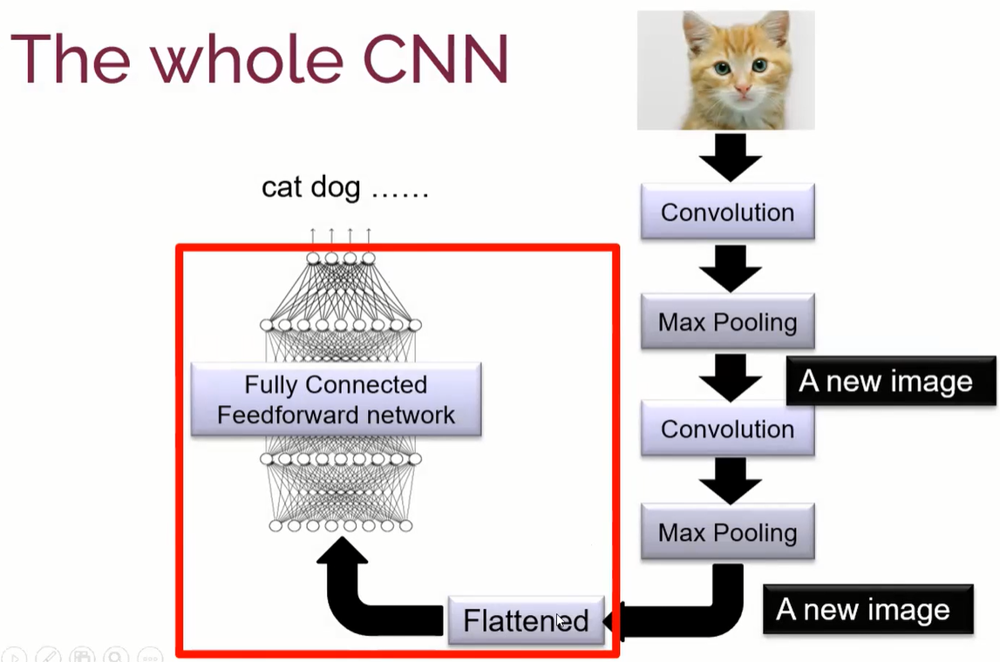

<span style="color:red">CNN vs ANN ve ANN Parametreleri</span>
- CNN connection sayısını azaltır
- Köşelerde edge noktalardaki ağırlıkları diğer nöronlarla paylaşır ve parametre sayımız düşer ve computational gain elde etmemizi sağlar.
- Max pooling yaparak bütün veriyi doğrudan sokmak yerine o pixellerin en büyüğü işleme sokularak parametre sayısı biraz daha düşürülür.
- Pooling zorunlu ama ister max yap ister mean yap (domain knowledge)


<span style="color:red">CNN in KERAS</span>
- 28X28 ik siyah beyaz bir resim (input) var ve elimde 25 tane 3X3 lük filtrem var.
- Eğer resim renkli olsaydı input 28X28X3 olurdu. (R-G-B)
- Daha sonra 25 tane filtre uygulanmış matris lerden en yüksek olanları Max pooling ile alıp 2X2 lik çıktı alırız.

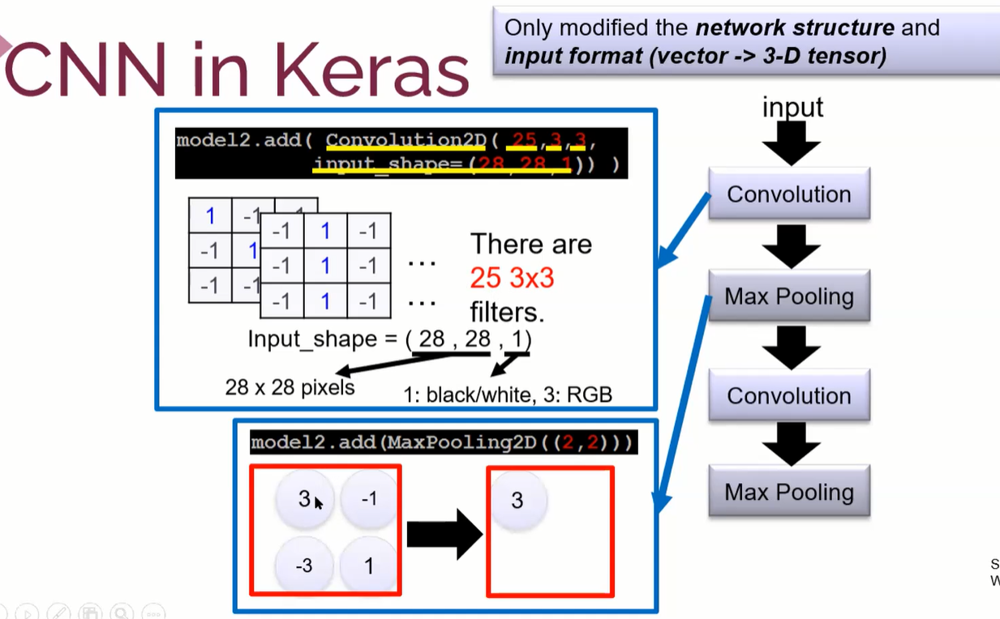

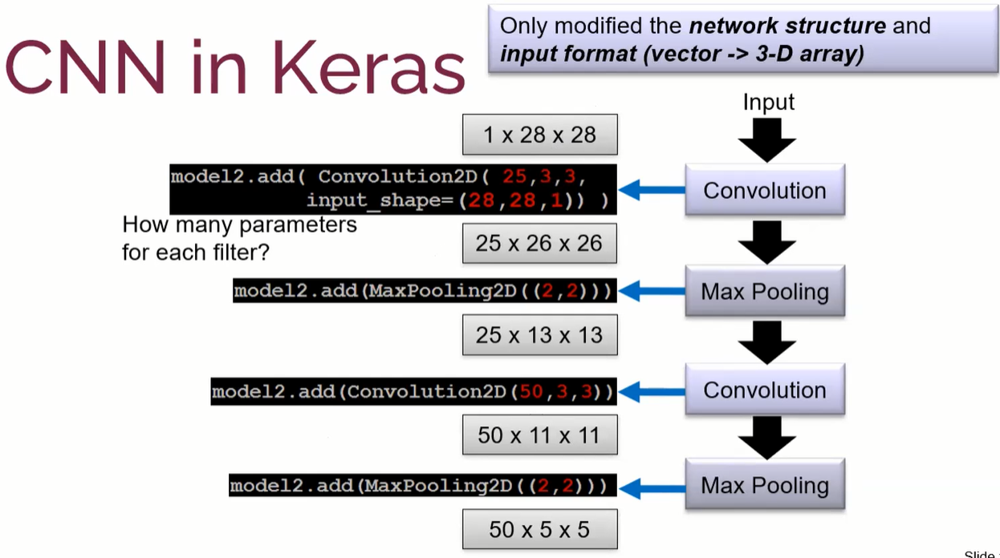

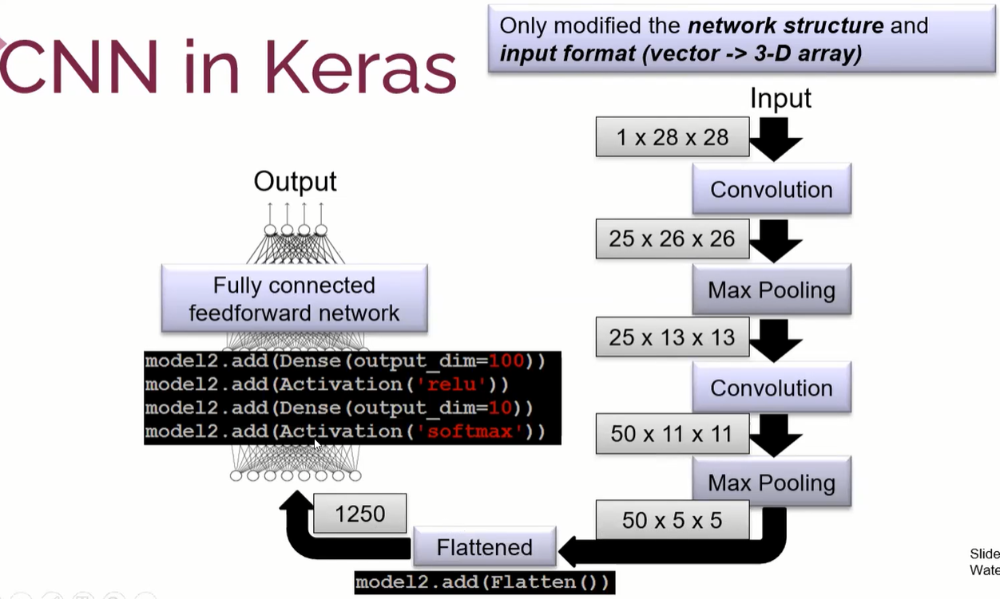

___

## **CNN with MNIST Data**

In [2]:
import pandas as pd 
import seaborn as sns
import tensorflow as tf                       
import numpy as np                           
import matplotlib.pyplot as plt               
%matplotlib inline

In [3]:
from tensorflow.keras.datasets.mnist import load_data    # To load the MNIST digit dataset (handwriting numbers)

(X_train, y_train) , (X_test, y_test) = load_data()      # Loading data (tuple unpacking ile ayırırz)

In [4]:
print("There are ", len(X_train), "images in the training dataset")     
print("There are ", len(X_test), "images in the test dataset")   

There are  60000 images in the training dataset
There are  10000 images in the test dataset


- Bunların head i alınıp bakılamaz çünkü bunlar image dır.

In [5]:
# Checking the shape of one image
X_train[5].shape

(28, 28)

In [6]:
X_train[5]

array([[  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,  13,  25, 100, 122,   7,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  

In [7]:
X_train[5].shape

(28, 28)

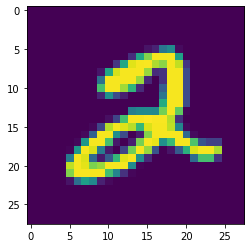

In [8]:
plt.imshow(X_train[5]);
# plt.matshow(X_train[5])

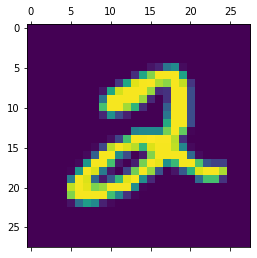

In [9]:
plt.matshow(X_train[5]);

In [10]:
y_train[5]

2

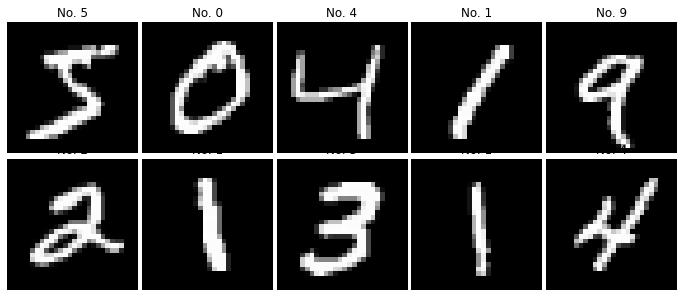

In [11]:
num_rows, num_cols = 2, 5
f, ax = plt.subplots(2, 5, figsize=(12,5),
                     gridspec_kw={'wspace':0.03, 'hspace':0.01}, 
                     squeeze=True)

for r in range(num_rows):
    for c in range(num_cols):   
        image_index = r * 5 + c
        ax[r,c].axis("off")
        ax[r,c].imshow( X_train[image_index], cmap='gray')
        ax[r,c].set_title('No. %d' % y_train[image_index])
plt.show()
plt.close()

## Data Preprocessing

In [12]:
X_train[5].min()

0

In [13]:
X_train[5].max()

255

In [14]:
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')
X_train /= 255
X_test /= 255

In [15]:
X_train[5].min()

0.0

In [16]:
X_train[5].max()

1.0

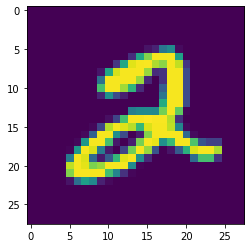

In [17]:
plt.imshow(X_train[5])

In [18]:
X_train = X_train.reshape(X_train.shape[0],28, 28, 1) # --> [0] satıra karşılık gelir. 1 --> siyah beyaz.
X_test = X_test.reshape(X_test.shape[0], 28, 28, 1)

In [19]:
X_train.shape, X_test.shape

((60000, 28, 28, 1), (10000, 28, 28, 1))

In [20]:
y_train # 0 dan 9 a kadar olan rakamlar, benim bunları kategorik yani class a dönüştürmem lazım ve bunu keras yapar.

array([5, 0, 4, ..., 5, 6, 8], dtype=uint8)

In [21]:
from tensorflow.keras.utils import to_categorical

In [22]:
Y_train = to_categorical(y_train, 10)  # --> y_traini al kategorik hale getir ve büyük Y 'ye ata. class sayısı 10 dur
Y_test = to_categorical(y_test, 10)  # --> yukarıdaki ile aynı.
Y_test.shape

(10000, 10)

In [23]:
from tensorflow.keras.models import Sequential  # Sequential modeli import ederiz.
from tensorflow.keras.layers import Dense, Conv2D, MaxPool2D, Flatten  # 1 tane conv. layer, 1 tane maxpool, 1 tane flatten layer ve en son output layerda kullanacağım dense layer

In [24]:
model = Sequential()  # 1 model selection

model.add(Conv2D(filters=32, kernel_size=(3,3),input_shape=(28, 28, 1), activation='relu',))  # 2 filtre koy otuz iki tane, 3X3 kernel ile, activation relu ve input 1X28X28

model.add(MaxPool2D(pool_size=(2, 2)))  # 3 pooling işlemi 28 ve 32 lik için 2,2 lik pooling yeterli. 
                                        # padding kurmadık çünkü köşelerde veri yok, olsaydı same atardım. 
                                        # stride 2

model.add(Flatten())  # 4 flatten ile matrislerimizi vektöre dönüştürürüz.

model.add(Dense(128, activation='relu'))  # 5 ANN de olduğu gibi nöron sayısı 128 activation relu

model.add(Dense(10, activation='softmax'))  # 6 ANN deki gibi 2. hidden layer isteğe bağlı kuruldu.

model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

**A sample example showing the conversion of 3D data to 2D**
![3Dto2D](https://dphi-courses.s3.ap-south-1.amazonaws.com/Deep+Learning+Bootcamp/3D+to++2D.png)

In [25]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 26, 26, 32)        320       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 13, 13, 32)        0         
_________________________________________________________________
flatten (Flatten)            (None, 5408)              0         
_________________________________________________________________
dense (Dense)                (None, 128)               692352    
_________________________________________________________________
dense_1 (Dense)              (None, 10)                1290      
Total params: 693,962
Trainable params: 693,962
Non-trainable params: 0
_________________________________________________________________


In [26]:
from tensorflow.keras.callbacks import EarlyStopping

In [27]:
early_stop = EarlyStopping(monitor='val_loss',patience=2)

In [28]:
model.fit(X_train, Y_train, batch_size=32, epochs=10, validation_data=(X_test,Y_test),callbacks=[early_stop])


Epoch 1/10
1875/1875 [==============================] - 50s 26ms/step - loss: 0.1447 - accuracy: 0.9572 - val_loss: 0.0557 - val_accuracy: 0.9826
Epoch 2/10
1875/1875 [==============================] - 49s 26ms/step - loss: 0.0507 - accuracy: 0.9841 - val_loss: 0.0440 - val_accuracy: 0.9845
Epoch 3/10
1875/1875 [==============================] - 38s 20ms/step - loss: 0.0310 - accuracy: 0.9906 - val_loss: 0.0397 - val_accuracy: 0.9868
Epoch 4/10
1875/1875 [==============================] - 43s 23ms/step - loss: 0.0210 - accuracy: 0.9933 - val_loss: 0.0440 - val_accuracy: 0.9863
Epoch 5/10
1875/1875 [==============================] - 45s 24ms/step - loss: 0.0141 - accuracy: 0.9955 - val_loss: 0.0393 - val_accuracy: 0.9883
Epoch 6/10
1875/1875 [==============================] - 49s 26ms/step - loss: 0.0102 - accuracy: 0.9966 - val_loss: 0.0527 - val_accuracy: 0.9853
Epoch 7/10
1875/1875 [==============================] - 66s 35ms/step - loss: 0.0074 - accuracy: 0.9977 - val_loss: 0.0518 -

In [29]:
model.metrics_names

['loss', 'accuracy']

In [30]:
model.history.history

{'loss': [0.14467868208885193,
  0.0507458820939064,
  0.03096209093928337,
  0.021036498248577118,
  0.014105137437582016,
  0.010229706764221191,
  0.007381404284387827],
 'accuracy': [0.9572166800498962,
  0.9841166734695435,
  0.9905999898910522,
  0.993316650390625,
  0.9954500198364258,
  0.9966166615486145,
  0.9977333545684814],
 'val_loss': [0.05569341406226158,
  0.04400387033820152,
  0.03969079628586769,
  0.043977342545986176,
  0.03933501988649368,
  0.05269821733236313,
  0.05181374028325081],
 'val_accuracy': [0.9825999736785889,
  0.984499990940094,
  0.9868000149726868,
  0.986299991607666,
  0.9883000254631042,
  0.9853000044822693,
  0.9861999750137329]}

In [31]:
summary = pd.DataFrame(model.history.history)
summary.head()

,loss,accuracy,val_loss,val_accuracy
0,0.144679,0.957217,0.055693,0.9826
1,0.050746,0.984117,0.044004,0.9845
2,0.030962,0.990600,0.039691,0.9868
3,0.021036,0.993317,0.043977,0.9863
4,0.014105,0.995450,0.039335,0.9883


Text(0.5, 0, 'Epoch')

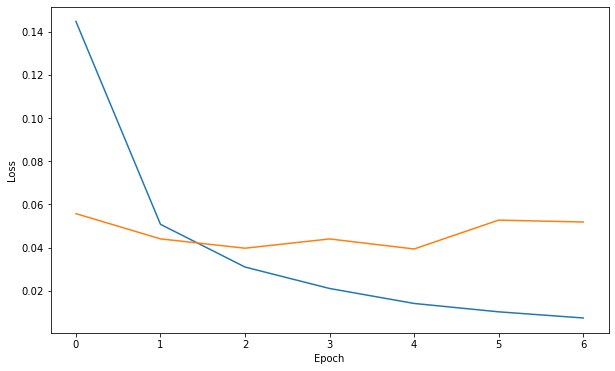

In [32]:
plt.figure(figsize=(10,6))
plt.plot(summary.loss)
plt.plot(summary.val_loss)
plt.ylabel("Loss")
plt.xlabel("Epoch")

Text(0.5, 0, 'Epoch')

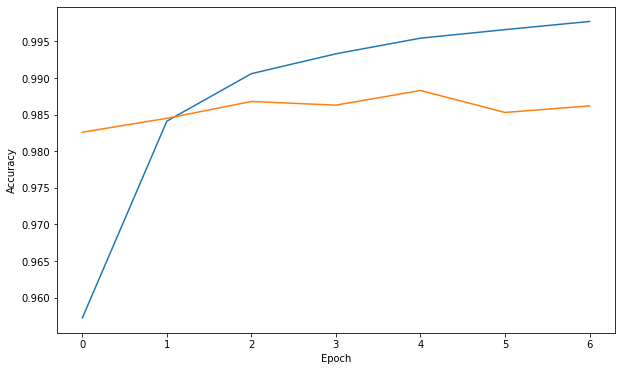

In [33]:
plt.figure(figsize=(10,6))
plt.plot(summary.accuracy)
plt.plot(summary.val_accuracy)
plt.ylabel("Accuracy")
plt.xlabel("Epoch")

In [34]:
print(model.evaluate(X_test,Y_test,verbose=1))  # soldaki loss sağdaki accuracy

313/313 [==============================] - 3s 10ms/step - loss: 0.0518 - accuracy: 0.9862
[0.05181374028325081, 0.9861999750137329]


In [35]:
from sklearn.metrics import classification_report,confusion_matrix

In [36]:
preds = model.predict(X_test)
# preds  # ihtimalleri alırız. ama predict classes kaldırıldı. Alttaki yöntem uygulanır.

In [37]:
predictions= np.argmax(preds, axis=1)

In [38]:
predictions

array([7, 2, 1, ..., 4, 5, 6], dtype=int64)

In [39]:
print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

           0       0.98      1.00      0.99       980
           1       0.99      1.00      0.99      1135
           2       0.99      0.99      0.99      1032
           3       0.99      0.99      0.99      1010
           4       0.98      0.99      0.99       982
           5       0.98      0.98      0.98       892
           6       0.99      0.98      0.99       958
           7       0.98      0.99      0.99      1028
           8       0.99      0.97      0.98       974
           9       0.99      0.97      0.98      1009

    accuracy                           0.99     10000
   macro avg       0.99      0.99      0.99     10000
weighted avg       0.99      0.99      0.99     10000



In [40]:
print(confusion_matrix(y_test, predictions))

[[ 978    1    0    0    0    0    0    1    0    0]
 [   1 1133    0    0    0    0    1    0    0    0]
 [   4    2 1017    0    1    0    0    6    2    0]
 [   0    0    2 1000    0    5    0    0    2    1]
 [   0    1    0    0  974    0    3    0    0    4]
 [   2    0    1    7    0  875    2    0    3    2]
 [   7    3    0    1    2    3  941    0    1    0]
 [   0    1    5    1    0    0    0 1018    1    2]
 [  10    0    3    2    3    1    1    1  948    5]
 [   0    2    0    1    9    5    0   10    4  978]]


In [41]:
score = model.evaluate(X_test, Y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Test loss: 0.05181374028325081
Test accuracy: 0.9861999750137329


In [42]:
my_number = X_test[0]

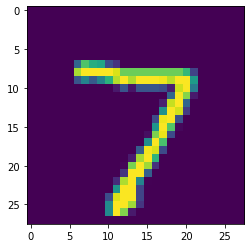

In [43]:
plt.imshow(my_number.reshape(28,28))

In [44]:
model.predict(my_number.reshape(1,28,28,1))

array([[2.8300362e-10, 1.4631079e-09, 8.6323988e-09, 1.3563979e-07,
        2.4128771e-10, 2.4141867e-12, 7.1233507e-16, 9.9999988e-01,
        7.0626960e-10, 8.4948706e-09]], dtype=float32)

In [45]:
# SHAPE --> (num_images,width,height,color_channels)
np.argmax(model.predict(my_number.reshape(1,28,28,1)), axis=1)

array([7], dtype=int64)

In [46]:
model.save("cnn-1.h5")